# Importing libraries and descriptive analysis

In [1]:
import pandas as pd 
import numpy as np 
import plotly.express as px 
import streamlit as st 
# To use the notebook backend which is more interactive
%matplotlib notebook

In [2]:
df1 = pd.read_csv("Transactions.csv")
df2 = pd.read_csv("Categories.csv")

In [3]:
# Perform the merge on 'MerchantName'
df = pd.merge(df1, df2, on='MerchantName', how='left')

In [4]:
df.head()

,CustomerID,MerchantName,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days),Category
0,1,Grill Emperor,1,4427,442.7,281,281,F&B
1,2,Threads Royale,1,2490,249.0,34,34,fashion
2,3,Cakeland,1,3000,300.0,236,236,F&B
3,4,Threads Royale,1,1620,162.0,320,320,fashion
4,5,Quick Stop,1,700,70.0,407,407,Grocery


In [5]:
# making sure that all merchants are in both dataframes
df1["MerchantName"].nunique()

59

In [6]:
df2["MerchantName"].nunique()

59

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43929 entries, 0 to 43928
Data columns (total 8 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   CustomerID                         43929 non-null  int64  
 1   MerchantName                       43929 non-null  object 
 2   TransactionRank                    43929 non-null  int64  
 3   TransactionRedeemedPoints          43929 non-null  int64  
 4   TransactionValue                   43929 non-null  float64
 5   TransactionFrom(days)              43929 non-null  int64  
 6   CustomerLastTransactionFrom(days)  43929 non-null  int64  
 7   Category                           43929 non-null  object 
dtypes: float64(1), int64(5), object(2)
memory usage: 2.7+ MB


In [8]:
# Checking for nulls
df.isna().mean()*100

CustomerID                           0.0
MerchantName                         0.0
TransactionRank                      0.0
TransactionRedeemedPoints            0.0
TransactionValue                     0.0
TransactionFrom(days)                0.0
CustomerLastTransactionFrom(days)    0.0
Category                             0.0
dtype: float64

In [9]:
# checking for duplicates 
df.duplicated().sum()

0

In [10]:
#description for numerical columns
df.describe()

,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days)
count,43929.000000,43929.000000,43929.00000,43929.000000,43929.000000,43929.000000
mean,17162.764552,1.269207,3352.54513,335.254513,185.201211,143.870313
std,9660.268835,0.784751,5916.63287,591.663287,122.209782,114.985727
min,1.000000,1.000000,0.00000,0.000000,1.000000,1.000000
25%,8699.000000,1.000000,1220.00000,122.000000,62.000000,34.000000
50%,17531.000000,1.000000,1890.00000,189.000000,203.000000,115.000000
75%,25630.000000,1.000000,3118.00000,311.800000,271.000000,252.000000
max,33521.000000,17.000000,263800.00000,26380.000000,698.000000,682.000000


In [11]:
#description for categorical columns
df.describe(include="O")

,MerchantName,Category
count,43929,43929
unique,59,13
top,Marketplace Central,Grocery
freq,19389,26483


In [12]:
df.shape

(43929, 8)

In [13]:
# i have 33,521 customer in my dataset
df["CustomerID"].nunique()

33521

# Data visualization 

### Univariate Analysis

In [14]:
# Categorical Columns
for i in df.select_dtypes(include='object'):
    fig = px.histogram(data_frame=df , x=i , title= i, text_auto=True )
    fig.show()

In [15]:
# as you can see we need to clean the categories so we make a function to return the right categories 
df.Category.unique()

array(['F&B', 'fashion', 'Grocery', 'Groceri', 'Health & Beauty',
       'Fashion', 'F_B', 'Electronics', 'Transportaion', 'Entertainment',
       'Car Services', 'Jewerlies', 'Optics'], dtype=object)

In [16]:
# Function to clean the category column
def clean_category(category):
    category = category.lower()  # Convert to lowercase
    if category in ['f_b', 'f&b']:  # Normalize F&B
        return 'F&B'
    elif category in ['grocery', 'groceri']:  # Normalize Grocery
        return 'Grocery'
    elif category == 'fashion':  # Normalize fashion
        return 'Fashion'
    return category.title()  # Capitalize other categories

# Apply the function to clean the Category column
df['Category'] = df['Category'].apply(clean_category)

In [17]:
df.Category.unique()

array(['F&B', 'Fashion', 'Grocery', 'Health & Beauty', 'Electronics',
       'Transportaion', 'Entertainment', 'Car Services', 'Jewerlies',
       'Optics'], dtype=object)

In [18]:
df.MerchantName.unique()

array(['Grill Emperor', 'Threads Royale', 'Cakeland', 'Quick Stop',
       'Marketplace Central', 'Family Grocers', 'Aroma Beans',
       'Zest Market', 'Herbal Wellness', 'ClearSight Optics',
       'Nuts & Seeds Co.', 'Smokehouse Grill', 'Peppers Diner',
       'Zanobia Textiles', 'City Squad Fashions', 'Global Media Hub',
       'Gizmo Genius', 'TouchTech Innovations', 'Sweets & Fizz',
       'Urban Rides', 'Mamma Mia', 'FryBird', 'Retro Rewind', 'Playland',
       'Lola Market', 'Lucky Finds', 'Morad Crafts', 'Date Palm Delights',
       'Cinema Egypt', 'TickTock Time', 'Rainbow Electronics',
       'Grandpa’s Kitchen', 'Guard Vogue', 'Canal Mart',
       'Tabouleh Tavern', 'Pie Corner', 'Bubble Joy', 'Diamond Dreams',
       'Gemstone Gallery', 'Oscar’s Bazaar', 'Nassif Jewels',
       'Breeze Spaces', 'Federation Retail', 'TechWave', 'SoundSphere',
       'Vision Vogue', 'Tie Territory', 'Gahar Goods', 'FishNet Seafoods',
       'Gabby’s Grill', 'Vincent’s Pizza', 'TravelTrend Lu

In [19]:
# numerical Columns
for j in df.select_dtypes(include='number'):
    fig_2 = px.histogram(data_frame=df , x=j)
    fig_2.show()

In [20]:
# customer_id should be str not int , so i will convert it
df['CustomerID'] = df['CustomerID'].astype(str)

In [21]:
df.CustomerID.info()

<class 'pandas.core.series.Series'>
RangeIndex: 43929 entries, 0 to 43928
Series name: CustomerID
Non-Null Count  Dtype 
--------------  ----- 
43929 non-null  object
dtypes: object(1)
memory usage: 343.3+ KB


In [22]:
# i won't need TransactionValue as i would use TransactionRedeemedPoints and both represt the same kind of info , so i will drop it to aviod redundancy
df = df.drop("TransactionValue", axis=1)

In [23]:
df[df["CustomerID"] == "11"]

,CustomerID,MerchantName,TransactionRank,TransactionRedeemedPoints,TransactionFrom(days),CustomerLastTransactionFrom(days),Category
11,11,Marketplace Central,1,2157,243,20,Grocery
12,11,Marketplace Central,2,2800,111,20,Grocery
13,11,Marketplace Central,3,1580,74,20,Grocery
14,11,Marketplace Central,4,1180,20,20,Grocery
15,11,Threads Royale,1,3980,321,20,Fashion


### Bivariate Analysis

In [24]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Assuming df is your dataframe
# Grouping by 'MerchantName' and calculating the mean for each merchant
merchant_stats = df.groupby('MerchantName').agg({
    'TransactionRank': 'mean',
    'TransactionRedeemedPoints': 'mean',
    'TransactionFrom(days)': 'mean',
    'CustomerLastTransactionFrom(days)': 'mean'
}).reset_index()

# Create subplots: one for each metric against MerchantName, with adjusted vertical spacing
fig = make_subplots(
    rows=4, cols=1,
    subplot_titles=[
        'Average Redeemed Points per Merchant',
        'Average Transaction Rank per Merchant',
        'Average Transaction From (days) per Merchant',
        'Average Last Transaction (days) per Merchant'
    ],
    vertical_spacing=0.2  # Adjust vertical spacing between subplots
)

# Add bar plots for each comparison
fig.add_trace(go.Bar(x=merchant_stats['MerchantName'], 
                     y=merchant_stats['TransactionRedeemedPoints'], 
                     name='Avg Redeemed Points'), 
              row=1, col=1)

fig.add_trace(go.Bar(x=merchant_stats['MerchantName'], 
                     y=merchant_stats['TransactionRank'], 
                     name='Avg Transaction Rank'), 
              row=2, col=1)

fig.add_trace(go.Bar(x=merchant_stats['MerchantName'], 
                     y=merchant_stats['TransactionFrom(days)'], 
                     name='Avg Transaction From (days)'), 
              row=3, col=1)

fig.add_trace(go.Bar(x=merchant_stats['MerchantName'], 
                     y=merchant_stats['CustomerLastTransactionFrom(days)'], 
                     name='Avg Last Transaction (days)'), 
              row=4, col=1)

# Update layout
fig.update_layout(
    height=1400,  # Increase height to give more room for each plot
    width=1100,  # Adjust width if necessary
    title_text="Merchant Comparison Against Key Metrics", 
    showlegend=False
)

# Show the plot
fig.show()


In [25]:
category_stats = df.groupby('Category').agg({
    'TransactionRank': 'mean',
    'TransactionRedeemedPoints': 'mean',
    'TransactionFrom(days)': 'mean',
    'CustomerLastTransactionFrom(days)': 'mean'
}).reset_index()

# Create subplots: one for each metric against Category, with adjusted vertical spacing
fig = make_subplots(
    rows=4, cols=1,
    subplot_titles=[
        'Average Redeemed Points per Category',
        'Average Transaction Rank per Category',
        'Average Transaction From (days) per Category',
        'Average Last Transaction (days) per Category'
    ],
    vertical_spacing=0.1  # Adjust vertical spacing between subplots
)

# Add bar plots for each comparison
fig.add_trace(go.Bar(x=category_stats['Category'], 
                     y=category_stats['TransactionRedeemedPoints'], 
                     name='Avg Redeemed Points'), 
              row=1, col=1)

fig.add_trace(go.Bar(x=category_stats['Category'], 
                     y=category_stats['TransactionRank'], 
                     name='Avg Transaction Rank'), 
              row=2, col=1)

fig.add_trace(go.Bar(x=category_stats['Category'], 
                     y=category_stats['TransactionFrom(days)'], 
                     name='Avg Transaction From (days)'), 
              row=3, col=1)

fig.add_trace(go.Bar(x=category_stats['Category'], 
                     y=category_stats['CustomerLastTransactionFrom(days)'], 
                     name='Avg Last Transaction (days)'), 
              row=4, col=1)

# Update layout
fig.update_layout(
    height=1400,  # Increase height to give more room for each plot
    width=1100,  # Adjust width if necessary
    title_text="Category Comparison Against Key Metrics", 
    showlegend=False
)

# Show the plot
fig.show()

In [26]:
avg_redeemed_per_rank = df.groupby('TransactionRank').agg({
    'TransactionRedeemedPoints': 'mean'
}).reset_index()

# Create a bar plot to visualize the average redeemed points per transaction rank
fig = px.bar(avg_redeemed_per_rank, 
             x='TransactionRank', 
             y='TransactionRedeemedPoints', 
             title='Average Redeemed Points per Transaction Rank',
             labels={'TransactionRank': 'Transaction Rank', 
                     'TransactionRedeemedPoints': 'Average Redeemed Points'})

# Show the plot
fig.show()

In [27]:
df.columns

Index(['CustomerID', 'MerchantName', 'TransactionRank',
       'TransactionRedeemedPoints', 'TransactionFrom(days)',
       'CustomerLastTransactionFrom(days)', 'Category'],
      dtype='object')

# RFM

In [28]:
# Step 1: Compute RFM values by grouping by 'CustomerID', 'Category', and 'MerchantName'
rfm_values = df.groupby(['CustomerID', 'Category', 'MerchantName']).agg({
    'CustomerLastTransactionFrom(days)': 'min',  # Recency: how many days since the last transaction
    'TransactionRedeemedPoints': ['count', 'sum']  # Frequency: number of transactions, Monetary: total redeemed points
}).reset_index()

# Step 2: Rename the columns for clarity
rfm_values.columns = ['CustomerID', 'Category', 'MerchantName', 'Recency', 'Frequency', 'Monetary']

# Example of RFM values:
rfm_values.head()

# You can now proceed with scaling, clustering, and recommending based on RFM values including Category and Merchant.


,CustomerID,Category,MerchantName,Recency,Frequency,Monetary
0,1,F&B,Grill Emperor,281,1,4427
1,10,Grocery,Marketplace Central,269,1,1030
2,100,Grocery,Marketplace Central,258,1,1190
3,1000,F&B,Grill Emperor,51,1,2000
4,10000,Fashion,Threads Royale,120,1,1600


In [29]:
rfm_values[rfm_values["CustomerID"] == "11" ]

,CustomerID,Category,MerchantName,Recency,Frequency,Monetary
1180,11,Fashion,Threads Royale,20,1,3980
1181,11,Grocery,Marketplace Central,20,4,7717


In [30]:
# Assign scores for Recency, Frequency, and Monetary
rfm_values['R_Score'] = pd.qcut(rfm_values['Recency'], 5, labels=[5, 4, 3, 2, 1])
rfm_values['F_Score'] = pd.qcut(rfm_values['Frequency'].rank(method='first'), 5, labels=[1, 2, 3, 4, 5])
rfm_values['M_Score'] = pd.qcut(rfm_values['Monetary'], 5, labels=[1, 2, 3, 4, 5])

# Combine RFM scores into a single RFM score
rfm_values['RFM_Score'] = rfm_values['R_Score'].astype(str) + rfm_values['F_Score'].astype(str) + rfm_values['M_Score'].astype(str)

# Display the RFM table with scores
rfm_values 


,CustomerID,Category,MerchantName,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score
0,1,F&B,Grill Emperor,281,1,4427,1,1,5,115
1,10,Grocery,Marketplace Central,269,1,1030,1,1,1,111
2,100,Grocery,Marketplace Central,258,1,1190,2,1,1,211
3,1000,F&B,Grill Emperor,51,1,2000,4,1,3,413
4,10000,Fashion,Threads Royale,120,1,1600,3,1,2,312
...,...,...,...,...,...,...,...,...,...,...
36494,9995,Grocery,Marketplace Central,20,1,390,5,5,1,551
36495,9996,Grocery,Marketplace Central,39,1,1660,4,5,2,452
36496,9997,Fashion,Threads Royale,202,1,2380,3,5,3,353
36497,9998,Grocery,Marketplace Central,161,1,800,3,5,1,351


In [31]:
rfm_values= rfm_values.drop(["Recency",	"Frequency","Monetary", "R_Score","F_Score","M_Score"], axis=1)

In [32]:
rfm_values

,CustomerID,Category,MerchantName,RFM_Score
0,1,F&B,Grill Emperor,115
1,10,Grocery,Marketplace Central,111
2,100,Grocery,Marketplace Central,211
3,1000,F&B,Grill Emperor,413
4,10000,Fashion,Threads Royale,312
...,...,...,...,...
36494,9995,Grocery,Marketplace Central,551
36495,9996,Grocery,Marketplace Central,452
36496,9997,Fashion,Threads Royale,353
36497,9998,Grocery,Marketplace Central,351


In [33]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score


# Define clustering models and their pipelines
models = {
    'KMeans': Pipeline([
        ('scaler', StandardScaler()),
        ('kmeans', KMeans(n_clusters=5,random_state=42))  
    ]),
    'Hierarchical': Pipeline([
        ('scaler', StandardScaler()),
        ('hierarchical', AgglomerativeClustering(n_clusters=5))
    ])
}

# Function to evaluate clustering models
def evaluate_model(pipeline, data):
    # Fit the model and predict clusters
    labels = pipeline.fit_predict(data)
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(data, labels) if len(set(labels)) > 1 else -1
    return labels, silhouette_avg

# Evaluate each model on the dataset (using 'RFM_Score')
results = {}
for model_name, pipeline in models.items():
    # You are now using the 'RFM_Score' column for clustering
    labels, score = evaluate_model(pipeline, rfm_values[['RFM_Score']])
    results[model_name] = {
        'Labels': labels,
        'Silhouette Score': score
    }

# Display the results
for model_name, result in results.items():
    print(f"Model: {model_name}, Silhouette Score: {result['Silhouette Score']}")


Model: KMeans, Silhouette Score: 0.8195662244008404
Model: Hierarchical, Silhouette Score: 0.8195662244008404


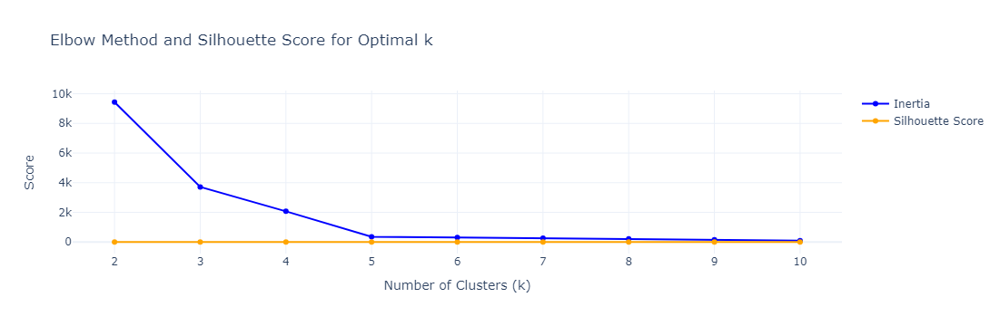

In [34]:
import plotly.graph_objects as go


# Prepare data for clustering using RFMScore
rfm_features = rfm_values[['RFM_Score']]

# Create a pipeline that first standardizes the data and then applies KMeans clustering
def get_pipeline(n_clusters):
    return Pipeline([
        ('scaler', StandardScaler()),
        ('kmeans', KMeans(n_clusters=n_clusters, random_state=42))
    ])

# Determine the optimal number of clusters using the Elbow method and Silhouette Score
inertia = []
silhouette_scores = []
k_values = range(2, 11)  # Start from 2 clusters to compute silhouette scores
for k in k_values:
    pipeline = get_pipeline(n_clusters=k)
    labels = pipeline.fit_predict(rfm_features)
    
    # Calculate inertia
    inertia.append(pipeline.named_steps['kmeans'].inertia_)
    
    # Calculate silhouette score
    silhouette_avg = silhouette_score(rfm_features, labels)
    silhouette_scores.append(silhouette_avg)

# Plotting the Elbow plot and Silhouette scores using Plotly
fig = go.Figure()

# Inertia plot
fig.add_trace(go.Scatter(x=list(k_values), y=inertia, mode='lines+markers', name='Inertia', line=dict(color='blue')))

# Silhouette Score plot
fig.add_trace(go.Scatter(x=list(k_values), y=silhouette_scores, mode='lines+markers', name='Silhouette Score', line=dict(color='orange')))

# Update layout
fig.update_layout(
    title='Elbow Method and Silhouette Score for Optimal k',
    xaxis_title='Number of Clusters (k)',
    yaxis_title='Score',
    template='plotly_white'
)

# Show the plot
fig.show()


In [35]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline

# Prepare data for clustering using RFM_Score
rfm_features = rfm_values[['RFM_Score']]  # Use RFM_Score for clustering

# Define the number of clusters based on the elbow plot
optimal_k = 5

# Create a pipeline for standardization and KMeans clustering
clustering_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Step 1: Standardize the features
    ('kmeans', KMeans(n_clusters=optimal_k, random_state=42))  # Step 2: Apply KMeans
])

# Fit the pipeline and predict the cluster for each customer
rfm_values['Cluster'] = clustering_pipeline.fit_predict(rfm_features)

# Display the RFM table with clusters
rfm_values


,CustomerID,Category,MerchantName,RFM_Score,Cluster
0,1,F&B,Grill Emperor,115,1
1,10,Grocery,Marketplace Central,111,1
2,100,Grocery,Marketplace Central,211,4
3,1000,F&B,Grill Emperor,413,0
4,10000,Fashion,Threads Royale,312,2
...,...,...,...,...,...
36494,9995,Grocery,Marketplace Central,551,3
36495,9996,Grocery,Marketplace Central,452,0
36496,9997,Fashion,Threads Royale,353,2
36497,9998,Grocery,Marketplace Central,351,2


# Streamlit App

In [36]:
rfm_values.to_csv("rfm_values.csv", index=False)

In [37]:
%%writefile rfm_app.py
import streamlit as st
import pandas as pd

# Load the rfm_values DataFrame from the CSV file
rfm_values = pd.read_csv("rfm_values.csv")

# Streamlit app
st.title("Personalized Offer Recommendations")

# Dropdown to select CustomerID
customer_ids = rfm_values['CustomerID'].unique()
selected_id = st.selectbox("Select a Customer ID", customer_ids)

# Fetching customer data
customer_data = rfm_values[rfm_values['CustomerID'] == selected_id]

if not customer_data.empty:
    # Display customer information
    st.write(f"**Customer ID:** {customer_data['CustomerID'].values[0]}")

    # Get the row with the highest RFM Score
    best_offer = customer_data.loc[customer_data['RFM_Score'].idxmax()]

    # Display the best recommendation
    st.write(f"**Best RFM Score:** {best_offer['RFM_Score']}")
    st.write(f"**Recommended Category:** {best_offer['Category']}")
    st.write(f"**Recommended Merchant:** {best_offer['MerchantName']}")
else:
    st.write("No data available for the selected Customer ID.")


Overwriting rfm_app.py


In [38]:
rfm_values[rfm_values["CustomerID"] == "11"]

,CustomerID,Category,MerchantName,RFM_Score,Cluster
1180,11,Fashion,Threads Royale,514,3
1181,11,Grocery,Marketplace Central,555,3
